# Image Art Styler
### By: Sam Anthony, Riley Bergamasco, Priya Aeron


---



---



## Import Libraries

In [1]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

## Define Model Functions

In [2]:
def crop_center(image):   # crop to square image
  shape = image.shape
  new_shape = min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  image = tf.image.crop_to_bounding_box(
      image, offset_y, offset_x, new_shape, new_shape)
  return image

@functools.lru_cache(maxsize=None)
def load_image(image_url, image_size=(256, 256), preserve_aspect_ratio=True):     # load and process images
  image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
  img = tf.io.decode_image(
      tf.io.read_file(image_path),
      channels=3, dtype=tf.float32)[tf.newaxis, ...]
  img = crop_center(img)
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

def show_images(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()

In [3]:
output_size = 384

content_img_size = (output_size, output_size)
style_img_size = (256, 256)

## Import TF Hub module

In [4]:
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

## Run Model

In [5]:
def run_model(content_urls, style_urls):
  for i in range(len(content_urls)):
    for j in range(len(style_urls)):
      content = content_urls[i]
      style = style_urls[j]
      content_image = load_image(content, content_img_size)
      style_image = load_image(style, style_img_size)
      style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')
      outputs = hub_module(tf.constant(content_image), tf.constant(style_image))
      stylized_image = outputs[0]
      show_images([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])

### Input the Image urls for all content images and the styles you would like to see them in into the content_urls and style_urls arrays.

  16384/Unknown - 0s 0us/stepDownloading data from https://i.pinimg.com/564x/b6/f4/a0/b6f4a01ddc7d82eff528915c2247207d.jpg
106496/93013 [==================================] - 0s 0us/step


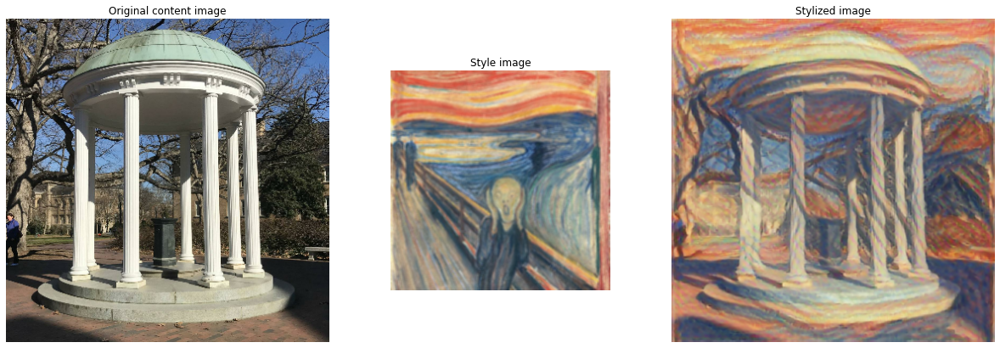

1605632/1590375 [==============================] - 0s 0us/step


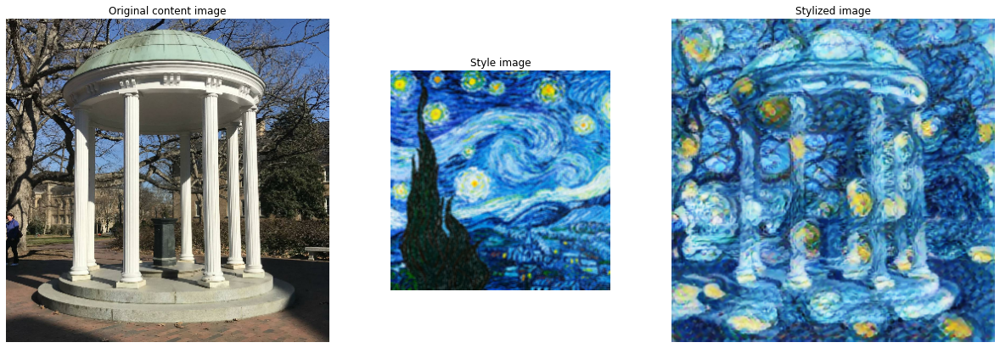

286720/273955 [===============================] - 0s 0us/step


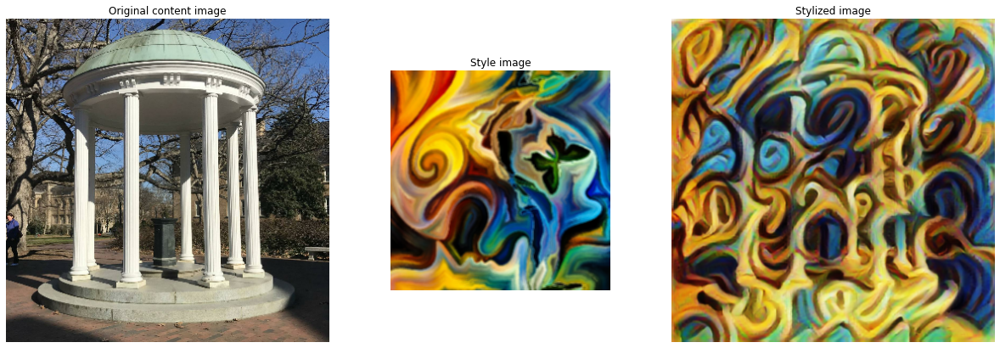

319488/308796 [===============================] - 0s 1us/step


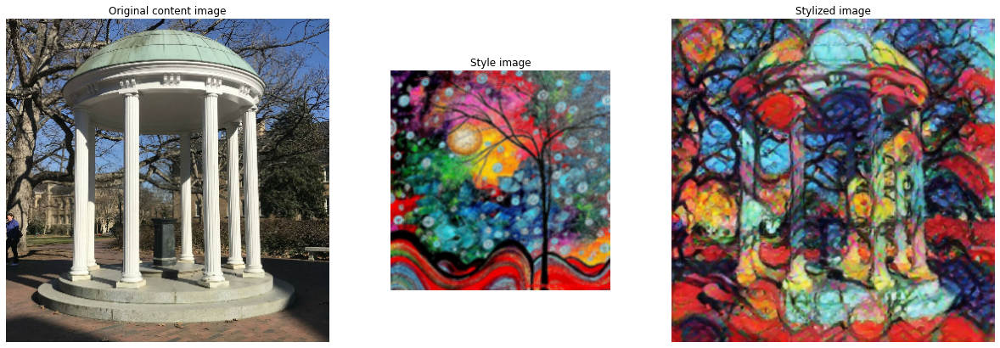

65536/55936 [===================================] - 0s 0us/step


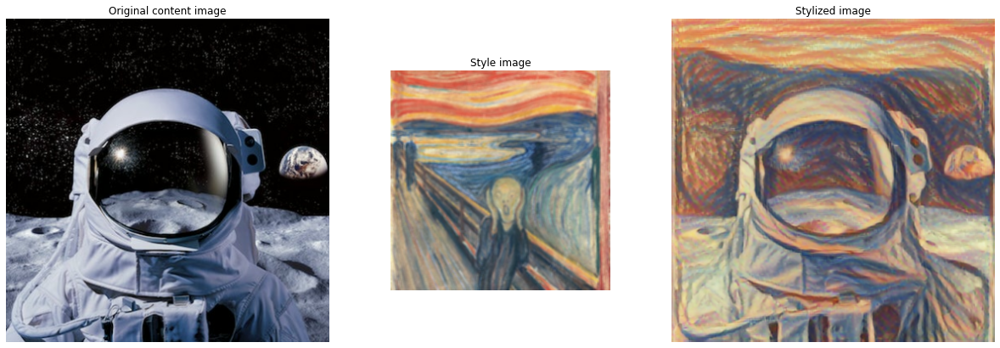

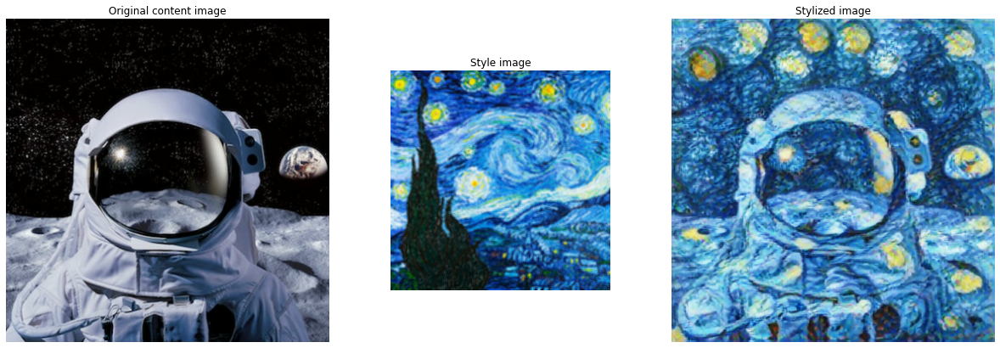

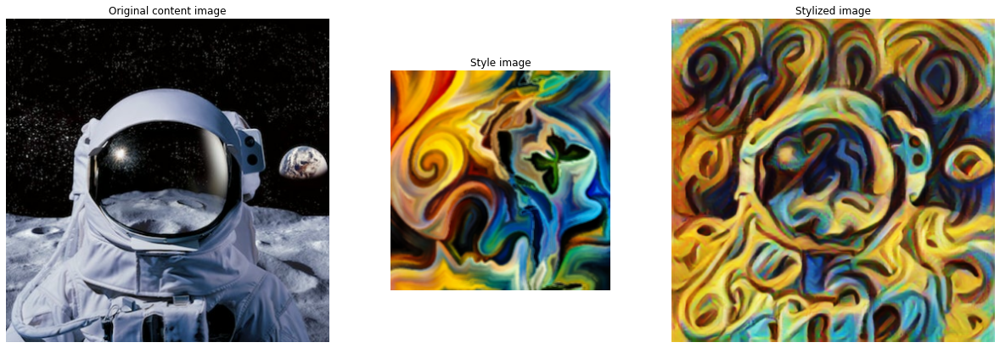

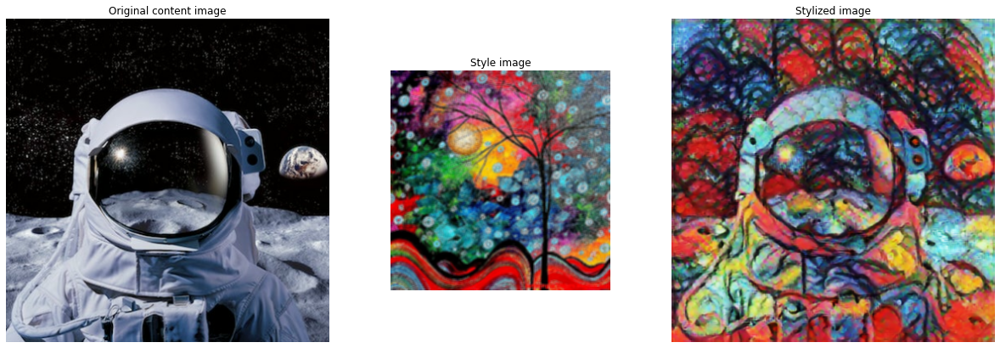

73728/63550 [==================================] - 0s 0us/step


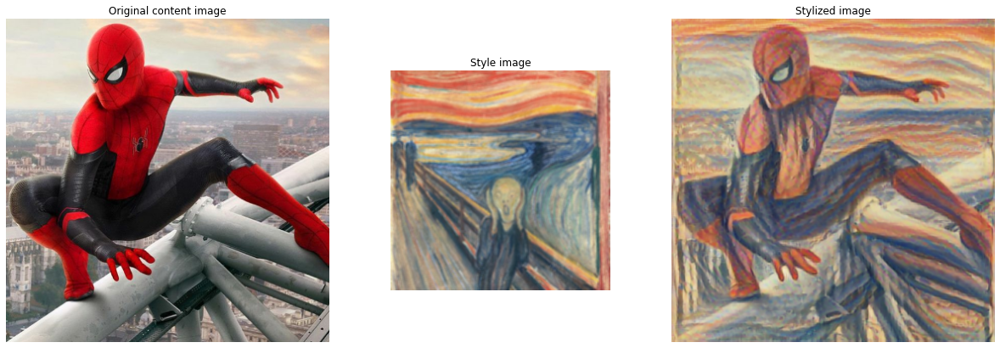

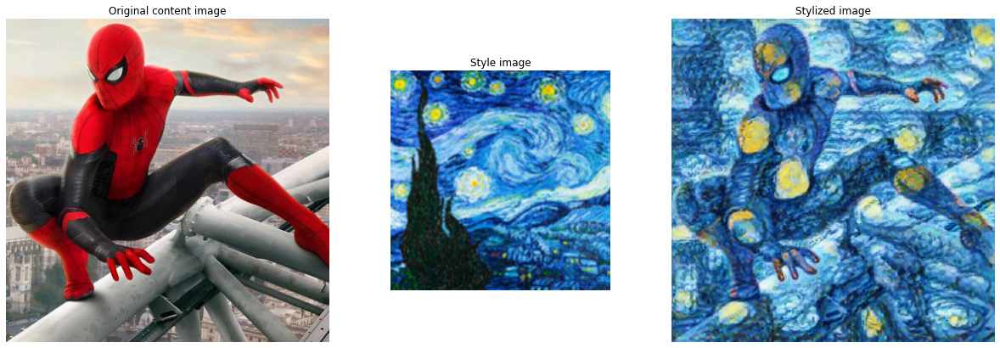

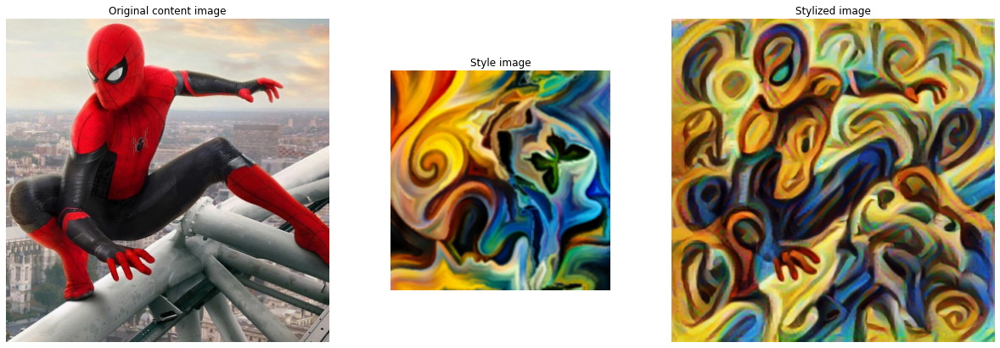

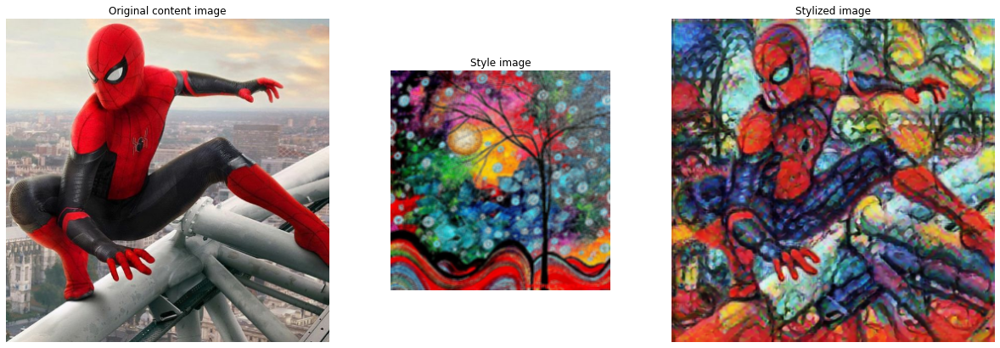

114688/100767 [==================================] - 0s 0us/step


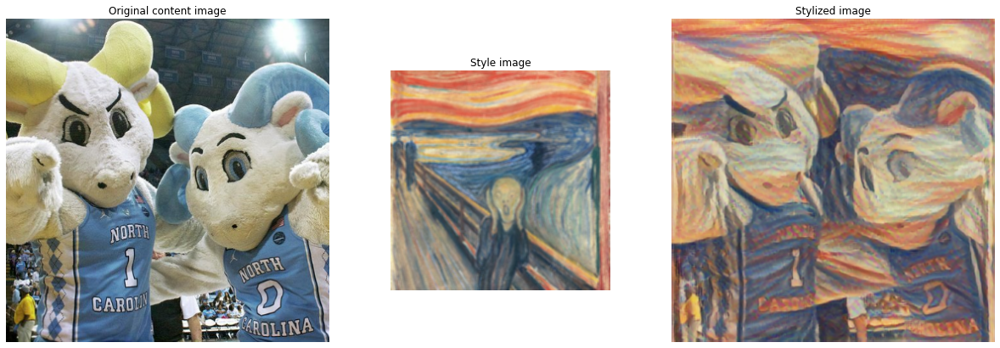

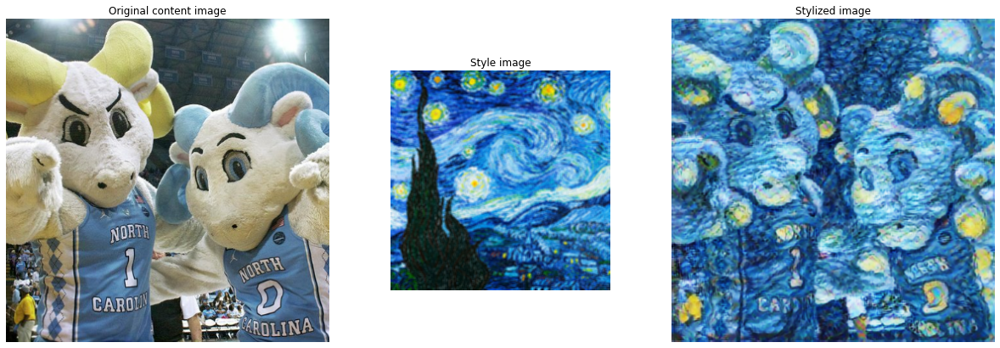

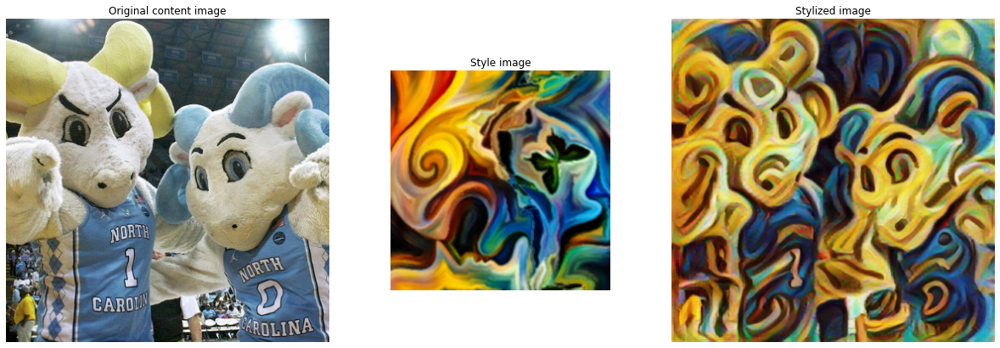

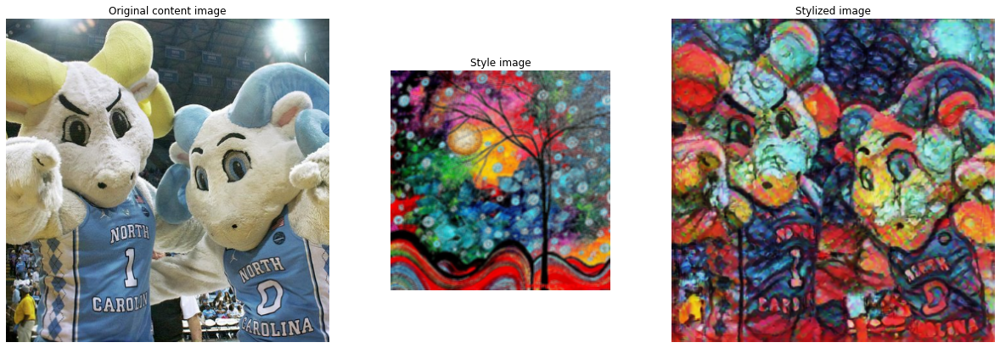

1957888/1947558 [==============================] - 0s 0us/step


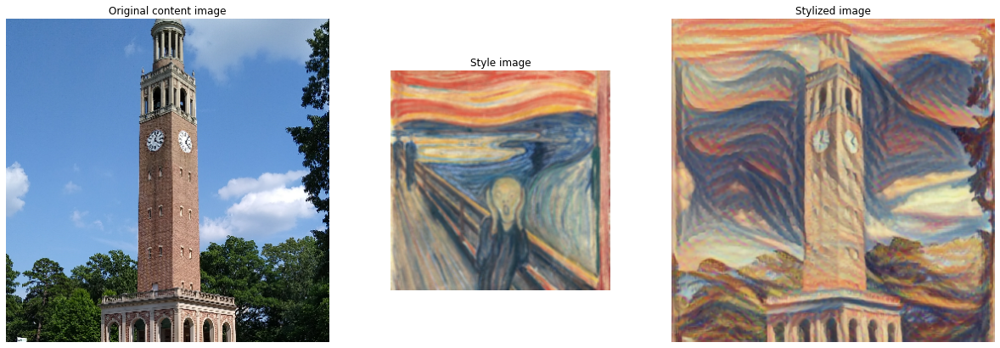

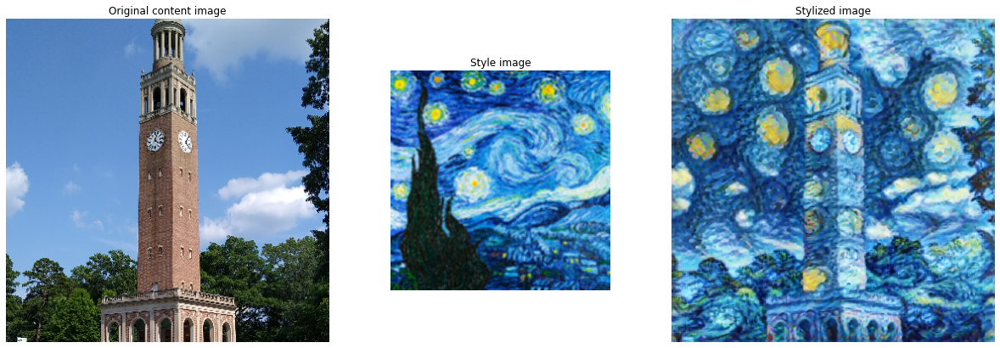

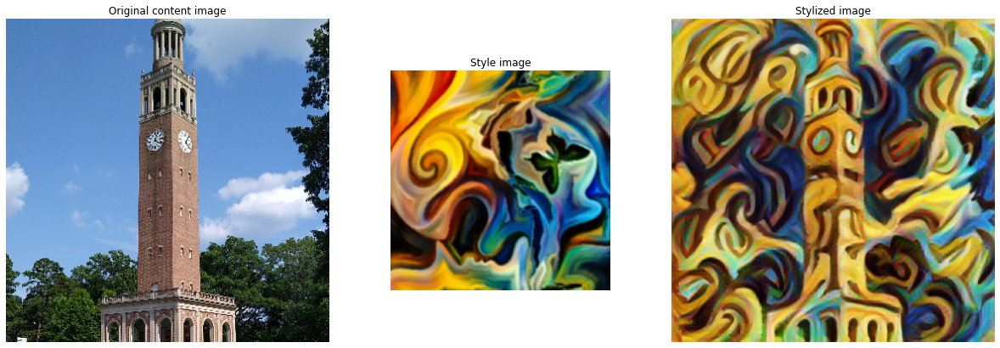

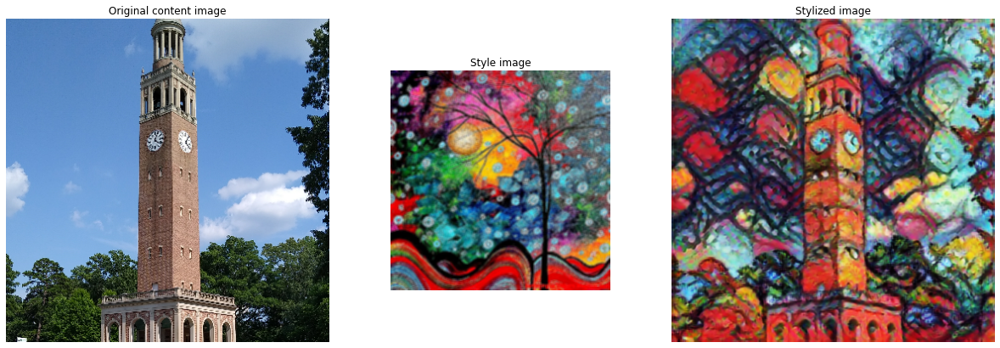

In [6]:
content_urls = ['https://bloximages.newyork1.vip.townnews.com/greensboro.com/content/tncms/assets/v3/editorial/0/6b/06b4d451-6b34-5c97-b616-e41007ce918c/5c39084957d03.image.jpg?crop=1211%2C1211%2C250%2C0&resize=1211%2C1211&order=crop%2Cresize', 'https://static.scientificamerican.com/blogs/cache/file/1D4440C5-CD59-4A53-A23648FF2C7CD0DD_source.jpg?w=590&h=800&B9BBE026-DB91-4291-B39DC8D859778498', 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/spider-man-movies-in-order-index-1631199371.jpeg?crop=0.565xw:1.00xh;0.435xw,0&resize=640:*', 'https://render.fineartamerica.com/images/rendered/default/greeting-card/images/artworkimages/medium/2/unc-ch-rameses-and-rj-orange-cat-art.jpg?&targetx=0&targety=-15&imagewidth=700&imageheight=530&modelwidth=700&modelheight=500&backgroundcolor=A8A59B&orientation=0', 'https://upload.wikimedia.org/wikipedia/commons/e/ea/Bell_tower_in_Chapel_Hill_%28cropped%29.jpg']
style_urls = ['https://i.pinimg.com/564x/b6/f4/a0/b6f4a01ddc7d82eff528915c2247207d.jpg', 'https://media.sanctuarymentalhealth.org/wp-content/uploads/2021/03/04151535/The-Starry-Night.jpg', 'https://pixfeeds.com/images/arts/1280-689521286-visualization-of-inner-paint.jpg','https://www.artranked.com/images/16/1600461a08e47fec9d58fc3fbb379d90.jpeg']

run_model(content_urls, style_urls)